# Event Embeddings

Let's go down the deep learning path to generate event embeddings. 

We will leverage a LSTM based autoencoder to feed in the past N events before the first-touch event and extract the hidden layer representation

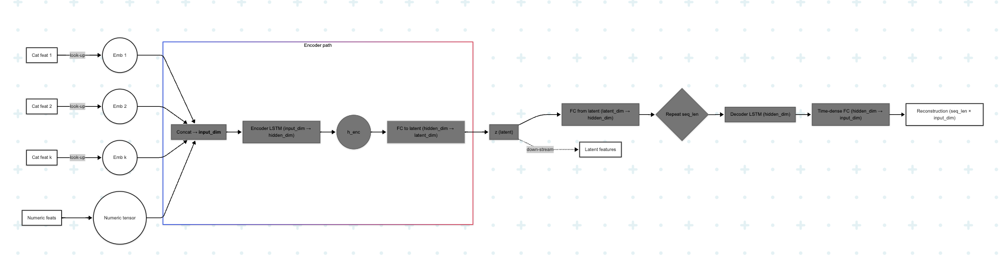

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch

torch.backends.mps.is_available()

True

In [14]:
events_df = pd.read_csv("processed_data/clean_events_w_engineered_feats.csv")

/var/folders/xz/9p327hsj39n6prk52zdm1x4h0000gn/T/ipykernel_32847/2828202599.py:1: DtypeWarning: Columns (23) have mixed types. Specify dtype option on import or set low_memory=False.
  events_df = pd.read_csv("processed_data/clean_events_w_engineered_feats.csv")


In [71]:
model_df = pd.read_csv("processed_data/training_data.csv")

In [8]:
player_foul_commit_skill = pd.read_csv("processed_data/player_foul_commit_skill.csv")
team_foul_skill = pd.read_csv("processed_data/team_foul_skill.csv")

In [10]:
import arviz as az

player_skill_trace = az.from_netcdf("bayesian_models/player_foul_skill_trace.nc")

team_skill_trace = az.from_netcdf("bayesian_models/team_foul_skill_trace.nc")

In [15]:
events_df.columns

Index(['Unnamed: 0', 'id', 'index', 'period', 'timestamp', 'minute', 'second',
       'possession', 'player_possession', 'duration', 'related_events',
       'location', 'under_pressure', 'counterpress', 'type.id', 'type.name',
       'possession_team.id', 'possession_team.name', 'play_pattern.id',
       'play_pattern.name', 'team.id', 'team.name', 'tactics.formation',
       'tactics.lineup', 'player.id', 'player.name', 'position.id',
       'position.name', 'pass.length', 'pass.angle', 'pass.height.id',
       'pass.height.name', 'pass.body_part.id', 'pass.body_part.name',
       'pass.type.id', 'pass.type.name', 'pass.outcome.id',
       'pass.outcome.name', 'pass.receipient.id', 'pass.recipient.name',
       'pass.end_location', 'dribble.outcome.id', 'dribble.outcome.name',
       'ball_receipt.outcome.id', 'ball_receipt.outcome.name',
       'carry.end_location', 'duel.outcome.id', 'duel.outcome.name',
       'competition_id', 'match_id', 'x', 'y', 'home_team.home_team_id',
     

In [16]:
events_df["opp_team_id"] = np.where(
    events_df['possession_team.id'] == events_df['home_team.home_team_id'],
    events_df['away_team.away_team_id'],
    events_df['home_team.home_team_id']
)

In [17]:
uniq_teams = sorted(
    set(events_df['possession_team.id'])
    | set(events_df['opp_team_id'])
)
team2code = {tid: i for i, tid in enumerate(uniq_teams)}

In [19]:
# generate player and team code to be used later
events_df['player_code'] = pd.Categorical(events_df['player.id']).codes
events_df['poss_team_code'] = events_df['possession_team.id'].map(team2code)
events_df['opp_team_code'] = events_df['opp_team_id'].map(team2code)

In [20]:
# calculate minute norm for p foul

events_df['minute'] = events_df['minute'].astype(int)
events_df['minute_norm'] = (events_df['minute'] - events_df['minute'].mean()) / events_df['minute'].std()

In [36]:
events_df = events_df.dropna(subset=['x'])

In [37]:
events_df[events_df['zone_id'].isna()]['x']

Series([], Name: x, dtype: float64)

In [38]:
events_df.columns

Index(['Unnamed: 0', 'id', 'index', 'period', 'timestamp', 'minute', 'second',
       'possession', 'player_possession', 'duration', 'related_events',
       'under_pressure', 'counterpress', 'type.id', 'type.name',
       'possession_team.id', 'possession_team.name', 'play_pattern.id',
       'play_pattern.name', 'team.id', 'team.name', 'tactics.formation',
       'tactics.lineup', 'player.id', 'player.name', 'position.id',
       'position.name', 'pass.length', 'pass.angle', 'pass.height.id',
       'pass.height.name', 'pass.body_part.id', 'pass.body_part.name',
       'pass.type.id', 'pass.type.name', 'pass.outcome.id',
       'pass.outcome.name', 'pass.receipient.id', 'pass.recipient.name',
       'pass.end_location', 'dribble.outcome.id', 'dribble.outcome.name',
       'ball_receipt.outcome.id', 'ball_receipt.outcome.name',
       'carry.end_location', 'duel.outcome.id', 'duel.outcome.name',
       'competition_id', 'match_id', 'x', 'y', 'home_team.home_team_id',
       'away_team

In [43]:
# calculate the P(Foul | opp_team)

from scipy.special import expit

# --- extract posterior means ---
post = player_skill_trace.posterior

beta0_m       = post["β0"].mean(dim=("chain","draw")).values
beta_min_m    = post["β_minute"].mean(dim=("chain","draw")).values
beta_home_m   = post["β_home"].mean(dim=("chain","draw")).values
beta_zone_m   = post["β_zone"].mean(dim=("chain","draw")).values  # shape=(n_zones,)
# std_player_m = post["σ_player"].mean(dim=("chain","draw")).values
u_player_m = post["u_player"].mean(dim=("chain","draw")).values  # shape=(n_players,)

minute = events_df["minute_norm"].to_numpy()
is_home = events_df["is_home"].to_numpy()
zone_code = events_df["zone_id"].astype(int).to_numpy()
player_code = events_df["player_code"].to_numpy() 

# --- compute the linear predictor ---
pred = (
      beta0_m
    + beta_min_m  * minute
    + beta_home_m * is_home
    + beta_zone_m[zone_code]
    + u_player_m[player_code]
)

# --- logistic transform → p_foul_bayes ---
events_df["p_foul_bayes_player"] = expit(pred)
events_df["player_foul_skill"] = u_player_m[events_df["player_code"].to_numpy()]

In [47]:
# calculate the P(Foul | player)

from scipy.special import expit

events_df['zone_code'] = pd.Categorical(events_df['zone_type']).codes
# --- extract posterior means ---
post = team_skill_trace.posterior

beta0_m       = post["β0"].mean(dim=("chain","draw")).values
beta_min_m    = post["β_min"].mean(dim=("chain","draw")).values
beta_home_m   = post["β_home"].mean(dim=("chain","draw")).values
beta_zone_m   = post["β_zone"].mean(dim=("chain","draw")).values  # shape=(n_zones,)
# std_player_m = post["σ_player"].mean(dim=("chain","draw")).values
u_team_m = post["u_team"].mean(dim=("chain","draw")).values  # shape=(n_players,)

minute = events_df["minute_norm"].to_numpy()
is_home = events_df["is_home"].to_numpy()
zone_code = events_df["zone_code"].astype(int).to_numpy()
opp_team_code = events_df["opp_team_code"].to_numpy() 

# --- compute the linear predictor ---
pred = (
      beta0_m
    + beta_min_m  * minute
    + beta_home_m * is_home
    + beta_zone_m[zone_code]
    + u_team_m[opp_team_code]
)

# --- logistic transform → p_foul_bayes ---
events_df["p_foul_bayes_opp_team"] = expit(pred)
events_df["opp_team_foul_skill"] = u_team_m[events_df["opp_team_code"].to_numpy()]

In [48]:
def parse_timestamp(ts):
    # '00:32:18.937' → seconds
    if isinstance(ts, str):
        t = pd.to_timedelta("00:" + ts.split(":")[-2] + ":" + ts.split(":")[-1])
        return t.total_seconds()
    return None

events_df['timestamp'] = events_df["timestamp"].apply(parse_timestamp)

In [57]:
def sequence_engineering(seq):
    seq = seq.copy()
   
    seq["skill_diff"] = seq["player_foul_skill"] - seq["opp_team_foul_skill"]

    # rolling stats on p_foul_bayes
    p = seq["p_foul_bayes_player"]
    seq["p_foul_player_mean_L"] = p.rolling(len(p)).mean().fillna(0)
    seq["p_foul_player_std_L"]  = p.rolling(len(p)).std().fillna(0)
    seq["p_foul_player_max_L"]  = p.rolling(len(p)).max().fillna(0)
    p = seq['p_foul_bayes_opp_team']
    seq["p_foul_team_mean_L"] = p.rolling(len(p)).mean().fillna(0)
    seq["p_foul_team_std_L"]  = p.rolling(len(p)).std().fillna(0)
    seq["p_foul_team_max_L"]  = p.rolling(len(p)).max().fillna(0)
    
    # cumulative fouls & pressure
    # seq["cum_fouls"]      = seq["is_foul_committed"].cumsum()
    seq["pressure_frac_L"]= seq["under_pressure"].rolling(len(p)).mean().fillna(0)

    # temporal features
    ts = seq["timestamp"].astype(float)
    seq["seq_duration"] = ts.iloc[-1] - ts.iloc[0]
    seq["avg_delta_t"]  = np.diff(ts, prepend=ts.iloc[0]).mean()

    # spatial dispersion
    xs, ys = seq["x"], seq["y"]
    seq["span_x"]       = xs.max() - xs.min()
    seq["span_y"]       = ys.max() - ys.min()
    seq["path_length"]  = np.sqrt(np.diff(xs)**2 + np.diff(ys)**2).sum()

    # attack fraction
    seq["is_attack"]      = seq["type.name"].isin(["Shot","Cross"]).astype(int)
    seq["attack_frac_L"]  = seq["is_attack"].rolling(len(p)).mean().fillna(0)

    return seq

In [54]:
events_df.columns

Index(['Unnamed: 0', 'id', 'index', 'period', 'timestamp', 'minute', 'second',
       'possession', 'player_possession', 'duration', 'related_events',
       'under_pressure', 'counterpress', 'type.id', 'type.name',
       'possession_team.id', 'possession_team.name', 'play_pattern.id',
       'play_pattern.name', 'team.id', 'team.name', 'tactics.formation',
       'tactics.lineup', 'player.id', 'player.name', 'position.id',
       'position.name', 'pass.length', 'pass.angle', 'pass.height.id',
       'pass.height.name', 'pass.body_part.id', 'pass.body_part.name',
       'pass.type.id', 'pass.type.name', 'pass.outcome.id',
       'pass.outcome.name', 'pass.receipient.id', 'pass.recipient.name',
       'pass.end_location', 'dribble.outcome.id', 'dribble.outcome.name',
       'ball_receipt.outcome.id', 'ball_receipt.outcome.name',
       'carry.end_location', 'duel.outcome.id', 'duel.outcome.name',
       'competition_id', 'match_id', 'x', 'y', 'home_team.home_team_id',
       'away_team

In [70]:
import data_prep

tmp = data_prep.prepare_data_for_model(events_df)

In [65]:
# running once to generate sequence features and fit them to standardScaler

num_samples = 10000
SEQ_LEN=7
numeric_cols = [
    'duration', 'under_pressure', 'x', 'y',
    'delta_x', 'delta_y', 'move_speed', 'event_time_sec', 'delta_time',
    'distance_to_goal', 'angle_to_goal', 'p_foul_bayes_player',
    'player_foul_skill', 'p_foul_bayes_opp_team', 'team_foul_skill',
    'skill_diff', 'p_foul_player_mean_L','p_foul_player_std_L','p_foul_player_max_L',
    'p_foul_team_mean_L','p_foul_team_std_L','p_foul_team_max_L', 'pressure_frac_L',
    # 'seq_duration','avg_delta_t',
    # 'span_x','span_y','path_length',
    'is_attack','attack_frac_L'
]
Dim_numeric = len(numeric_cols)
num_inputs = np.zeros((num_samples, SEQ_LEN, Dim_numeric), dtype=np.float32)
sampled_model_df = model_df.sample(n=num_samples)
events_df['under_pressure'] = events_df['under_pressure'].fillna(False).astype(int)
first_idxs = sampled_model_df["index"].to_numpy()
engineered_seqs = pd.DataFrame()
for i, idx in enumerate(first_idxs):
    start = max(0, idx - SEQ_LEN)
    L = idx - start
    sequence = events_df[start:idx]
    engineered_seq = sequence_engineering(sequence)
    engineered_seqs = pd.concat([engineered_seqs, engineered_seq], axis=0)

/var/folders/xz/9p327hsj39n6prk52zdm1x4h0000gn/T/ipykernel_32847/3874826140.py:19: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  events_df['under_pressure'] = events_df['under_pressure'].fillna(False).astype(int)


In [66]:
pd.set_option('display.max_columns', None)
engineered_seqs[numeric_cols].head(10)

,duration,under_pressure,x,y,delta_x,delta_y,move_speed,event_time_sec,delta_time,distance_to_goal,angle_to_goal,p_foul_bayes_player,player_foul_skill,p_foul_bayes_opp_team,team_foul_skill,skill_diff,p_foul_player_mean_L,p_foul_player_std_L,p_foul_player_max_L,p_foul_team_mean_L,p_foul_team_std_L,p_foul_team_max_L,pressure_frac_L,is_attack,attack_frac_L
207,NaN,0,79.8,72.7,-0.034167,0.28500,0.287041,307,0.033333,0.528490,0.359270,0.011324,-1.640659,0.010937,-1.640659,-0.133618,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0,0.0
208,0.652781,1,79.8,72.7,0.000000,0.00000,0.000000,307,0.000000,0.528490,0.359270,0.011324,-1.640659,0.010937,-1.640659,-0.133618,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0,0.0
209,0.528695,0,42.8,9.0,-0.308333,-0.79625,0.853864,307,0.000000,0.751022,0.586283,0.010064,-1.712093,0.010937,-1.712093,-0.205052,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0,0.0
210,0.000000,1,76.4,73.3,0.280000,0.80375,0.851125,308,0.016667,0.552517,0.364213,0.011324,-1.640659,0.010937,-1.640659,-0.133618,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0,0.0
211,0.000000,1,43.7,6.8,-0.272500,-0.83125,0.874776,308,0.000000,0.759282,0.592033,0.010064,-1.712093,0.010937,-1.712093,-0.205052,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0,0.0
212,3.858979,1,43.7,6.8,0.000000,0.00000,0.000000,308,0.000000,0.759282,0.592033,0.010064,-1.712093,0.010937,-1.712093,-0.205052,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0,0.0
213,1.735449,0,71.5,71.8,0.231667,0.81250,0.844882,310,0.033333,0.566884,0.376324,0.011324,-1.640659,0.010937,-1.640659,-0.133618,0.010784,0.000674,0.011324,0.010937,0.0,0.010937,0.571429,0,0.0
654,4.183753,0,7.1,56.1,0.000000,0.00000,0.000000,937,0.000000,0.962117,0.466461,0.002642,-1.845575,0.005264,-1.845575,-0.658541,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0,0.0
655,3.220201,0,10.8,57.2,0.030833,0.01375,0.033760,942,0.083333,0.935053,0.463075,0.002642,-1.845575,0.005264,-1.845575,-0.658541,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0,0.0
656,NaN,0,68.8,56.1,0.483333,-0.01375,0.483529,945,0.050000,0.471748,0.429855,0.004829,-1.339383,0.005055,-1.339383,-0.152349,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0,0.0


In [67]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
numeric_cols = [
    'duration', 'under_pressure', 'x', 'y',
    'delta_x', 'delta_y', 'move_speed', 'event_time_sec', 'delta_time',
    'distance_to_goal', 'angle_to_goal', 'p_foul_bayes_player',
    'player_foul_skill', 'p_foul_bayes_opp_team', 'team_foul_skill',
    'skill_diff', 'p_foul_player_mean_L','p_foul_player_std_L','p_foul_player_max_L',
    'p_foul_team_mean_L','p_foul_team_std_L','p_foul_team_max_L', 'pressure_frac_L',
    'is_attack','attack_frac_L'
]

for col in numeric_cols:
    if engineered_seqs[col].nunique() == 2:
        # events_df[col] = events_df[col].fillna(0)
        engineered_seqs[col] = engineered_seqs[col].fillna(0)
    else:
        mean_val = engineered_seqs[col].mean()
        engineered_seqs[col] = engineered_seqs[col].fillna(mean_val)

scaler.fit(engineered_seqs[numeric_cols].values)

StandardScaler()

In [85]:
model_df[model_df['match_week']<=15].is_foul_won.value_counts()

is_foul_won
0    148447
1      1145
Name: count, dtype: int64

In [82]:
model_df.head()

,Unnamed: 0,match_id,possession,player_possession,n_events,index,is_foul_won,match_week,under_pressure,possession_team.id,team.id,player.id,position.id,pass.length,pass.angle,pass.height.id,pass.height.name,pass.body_part.id,pass.body_part.name,pass.type.id,pass.type.name,pass.outcome.id,pass.outcome.name,pass.receipient.id,pass.recipient.name,pass.end_location,dribble.outcome.id,dribble.outcome.name,ball_receipt.outcome.id,ball_receipt.outcome.name,carry.end_location,duel.outcome.id,duel.outcome.name,is_home,is_stoppage_time,minute_norm,zone_x,zone_y,zone_id,zone_type,side_of_pitch,is_penalty_area,x_norm,y_norm,delta_x,delta_y,move_speed,distance_to_goal,angle_to_goal,event_time_sec,delta_time
0,0,3753972,2,6,1,6,0,13,0,26,26,3057.0,19.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,False,-1.661655,2.0,2.0,10.0,Midfield,Center,False,0.501667,0.50875,-0.006667,0.00750,0.010035,0.498410,0.497206,0,0.000000
1,1,3753972,2,7,1,9,0,13,True,26,26,4631.0,9.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,False,-1.661655,2.0,2.0,10.0,Midfield,Center,False,0.436667,0.52000,-0.099167,0.00000,0.099167,0.563688,0.494352,1,0.000000
2,2,3753972,2,8,1,12,0,13,0,26,26,4726.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,False,-1.661655,1.0,3.0,7.0,Defensive,Right,False,0.276667,0.76125,-0.165833,0.23250,0.285582,0.769066,0.444838,4,0.033333
3,3,3753972,2,9,1,15,0,13,0,26,26,3644.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,False,-1.661655,1.0,1.0,5.0,Defensive,Center,False,0.237500,0.38875,-0.040833,-0.35750,0.359824,0.770573,0.523058,6,0.016667
4,4,3753972,2,10,1,18,0,13,0,26,26,4726.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,False,-1.661655,1.0,3.0,7.0,Defensive,Right,False,0.223333,0.75250,-0.014167,0.32875,0.329055,0.816681,0.449973,10,0.033333


In [93]:
events_df['duration'] = events_df['duration'].replace('mean',0)

/var/folders/xz/9p327hsj39n6prk52zdm1x4h0000gn/T/ipykernel_32847/1420604491.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  events_df['duration'] = events_df['duration'].replace('mean',0)


In [95]:
sampled_model_df = model_df[model_df['match_week'] < 20][['index']]

SEQ_LEN = 7
dirty_categorical_cols = ['possession_team.name', 'team.name', 'player.name', 'position.name', 'pass.outcome.name','dribble.outcome.name', 'side_of_pitch', 'zone_type']
categorical_cols = [f.replace('.', '_') for f in dirty_categorical_cols]
replace_col_dict = {d:c for d,c in zip(dirty_categorical_cols, categorical_cols)}

events_df = events_df.rename(columns=replace_col_dict)

vocab_sizes = {}
for col in categorical_cols:
    events_df[col] = events_df[col].astype(str).fillna("none")
    events_df[f"{col}_idx"] = pd.Categorical(events_df[col]).codes
    vocab_sizes[col] = events_df[f"{col}_idx"].nunique()



numeric_cols = [
    'duration', 'under_pressure', 'x', 'y',
    'delta_x', 'delta_y', 'move_speed', 'event_time_sec', 'delta_time',
    'distance_to_goal', 'angle_to_goal', 'p_foul_bayes_player',
    'player_foul_skill', 'p_foul_bayes_opp_team', 'team_foul_skill',
    'skill_diff', 'p_foul_player_mean_L','p_foul_player_std_L','p_foul_player_max_L',
    'p_foul_team_mean_L','p_foul_team_std_L','p_foul_team_max_L', 'pressure_frac_L',
    'is_attack','attack_frac_L'
]

Dim_numeric    = len(numeric_cols)

num_samples = len(sampled_model_df)

cat_inputs = {
    col: np.zeros((num_samples, SEQ_LEN), dtype=np.int64)
    for col in categorical_cols
}

num_inputs = np.zeros((num_samples, SEQ_LEN, Dim_numeric), dtype=np.float32)

first_idxs = sampled_model_df["index"].to_numpy()

for i, idx in enumerate(first_idxs):
    start = max(0, idx - SEQ_LEN)
    L = idx - start
    sequence = events_df[start:idx]
    engineered_sequence = sequence_engineering(sequence)
    for col in categorical_cols:
        cat_inputs[col][i, -L:] = sequence[f"{col}_idx"].to_numpy()
    numeric_seq = engineered_sequence[numeric_cols].to_numpy()
    num_inputs[i, -L:, :] = scaler.transform(numeric_seq)

cat_tensors = {
    col: torch.tensor(cat_inputs[col], dtype=torch.long)
    for col in categorical_cols
}
num_tensor = torch.tensor(num_inputs, dtype=torch.float32)

In [96]:
class LSTMAutoencoder(torch.nn.Module):
    def __init__(
        self
        , vocab_sizes: dict
        , num_feat_dim : int
        , emb_dim_map : dict = None
        , hidden_dim : int = 64
        , latent_dim : int = 32
        , seq_len : int = 7
    ):
        super().__init__()
        self.seq_len = seq_len
        
        if emb_dim_map is None:
            emb_dim_map = {feat: 8 for feat in vocab_sizes.keys()}

        # embeddings for string features
        self.embeddings = torch.nn.ModuleDict(
            {
                feat: torch.nn.Embedding(
                    num_embeddings=vocab_sizes[feat]
                    , embedding_dim=emb_dim_map[feat]
                )
                for feat in vocab_sizes
            }
        )

        # encoder LSTM
        tot_emb_dim       = sum(emb_dim_map.values())
        self.input_dim    = tot_emb_dim + num_feat_dim
        self.encoder_LSTM = torch.nn.LSTM(self.input_dim, hidden_dim, batch_first=True)

        # bottleneck
        self.fc_to_latent   = torch.nn.Linear(hidden_dim, latent_dim)
        self.fc_from_latent = torch.nn.Linear(latent_dim, hidden_dim)

        # Decoder LSTM
        self.decoder_LSTM = torch.nn.LSTM(hidden_dim, hidden_dim, batch_first=True)

        # reconstruct output
        self.output_fc = torch.nn.Linear(hidden_dim, self.input_dim)

    def forward(
        self
        , categorical_inputs: dict
        , numeric_feats: torch.Tensor
    ):
        emb_list = []
        for feat_name, emb_layer in self.embeddings.items():
            idx = categorical_inputs[feat_name]
            emb = emb_layer(idx)
            emb_list.append(emb)

        x                 = torch.cat(emb_list + [numeric_feats], dim=-1)
        _ , (hidden_enc, _) = self.encoder_LSTM(x)
        encoded           = hidden_enc.squeeze(0)
        z                 = self.fc_to_latent(encoded)

        hidden_dec     = self.fc_from_latent(z).unsqueeze(1).repeat(1, self.seq_len, 1)
        decoder_out, _ = self.decoder_LSTM(hidden_dec)
        reconstruct    = self.output_fc(decoder_out)

        return reconstruct, z

In [97]:
from torch.utils.data import Dataset, DataLoader

class SequenceDataset(torch.utils.data.Dataset):
    def __init__(self, cat_tensors, num_tensor):
        self.cat_tensors = cat_tensors
        self.num_tensor = num_tensor
        self.length = num_tensor.shape[0]

    def __len__(self):
        return self.length

    def __getitem__(self, idx):
        cat_inputs = {k: v[idx] for k, v in self.cat_tensors.items()}
        num_input = self.num_tensor[idx]
        return cat_inputs, num_input

In [98]:
dataset = SequenceDataset(cat_tensors, num_tensor)
loader = DataLoader(dataset, batch_size=64, shuffle=True)

In [99]:
model = LSTMAutoencoder(
    vocab_sizes=vocab_sizes,
    num_feat_dim=num_tensor.shape[2],  # D_num
    hidden_dim=64,
    latent_dim=32,
    seq_len=num_tensor.shape[1],       # sequence length
)

In [100]:
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
model = model.to(device)

In [101]:
criterion = torch.nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

In [102]:
epoch_dict = {}
for epoch in range(100):
    model.train()
    epoch_loss = 0

    for cat_batch, num_batch in loader:
        # Move to device
        cat_batch = {k: v.to(device) for k, v in cat_batch.items()}
        num_batch = num_batch.to(device)
        with torch.no_grad():
            emb_list = [model.embeddings[k](cat_batch[k]) for k in model.embeddings]
            x_input = torch.cat(emb_list + [num_batch], dim=-1)
        recon, _ = model(cat_batch, num_batch)
        loss = criterion(recon, x_input)  # Optional, for full recon
        # loss = hybrid_loss(recon, num_batch, binary_indices=[1, 5], numeric_indices=[0, 2, 3, 4])
        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()

        epoch_loss += loss.item()
    epoch_dict[epoch+1] = epoch_loss / len(loader)
    if epoch%10==0:
        
        print(f"Epoch {epoch}: Loss = {epoch_loss / len(loader):.4f}")

Epoch 0: Loss = 0.5151
Epoch 10: Loss = 0.2239
Epoch 20: Loss = 0.1542
Epoch 30: Loss = 0.1241
Epoch 40: Loss = 0.1046
Epoch 50: Loss = 0.0926
Epoch 60: Loss = 0.0835
Epoch 70: Loss = 0.0761
Epoch 80: Loss = 0.0702
Epoch 90: Loss = 0.0655


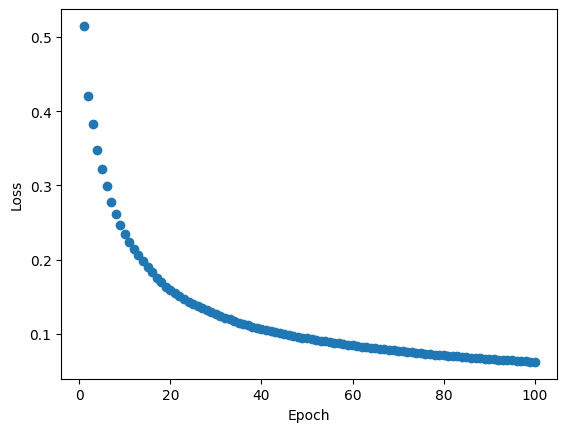

In [103]:
plt.scatter(list(epoch_dict.keys()), list(epoch_dict.values()))
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.show()

In [104]:
import matplotlib.pyplot as plt
import numpy as np

def visualize_reconstruction(model, cat_tensors, num_tensor, idx=0, numeric_cols=None, device='cpu'):
    """
    Visualize original vs. reconstructed numeric features for one sample.
    """
    model.eval()
    model = model.to(device)

    # Extract a single sample
    cat_sample = {k: v[idx:idx+1].to(device) for k, v in cat_tensors.items()}
    num_sample = num_tensor[idx:idx+1].to(device)

    # Get embeddings + input tensor
    with torch.no_grad():
        emb_list = [model.embeddings[k](cat_sample[k]) for k in model.embeddings]
        x_input = torch.cat(emb_list + [num_sample], dim=-1)
        recon, _ = model(cat_sample, num_sample)

    # Extract numeric part from input and reconstruction
    D_emb = sum(emb.embedding_dim for emb in model.embeddings.values())
    x_input_numeric = x_input[0, :, D_emb:].cpu().numpy()
    recon_numeric = recon[0, :, D_emb:].cpu().numpy()

    T = x_input_numeric.shape[0]
    D = x_input_numeric.shape[1]
    cols = numeric_cols or [f"feat_{i}" for i in range(D)]

    # Plot each feature over time
    fig, axs = plt.subplots(D, 1, figsize=(10, D*2), sharex=True)
    for i in range(D):
        axs[i].plot(range(T), x_input_numeric[:, i], label="Original", color="blue")
        axs[i].plot(range(T), recon_numeric[:, i], label="Reconstructed", color="orange", linestyle="--")
        axs[i].set_ylabel(cols[i])
        axs[i].legend()
    axs[-1].set_xlabel("Timestep")
    plt.suptitle("Original vs. Reconstructed Numeric Features")
    plt.tight_layout()
    plt.show()

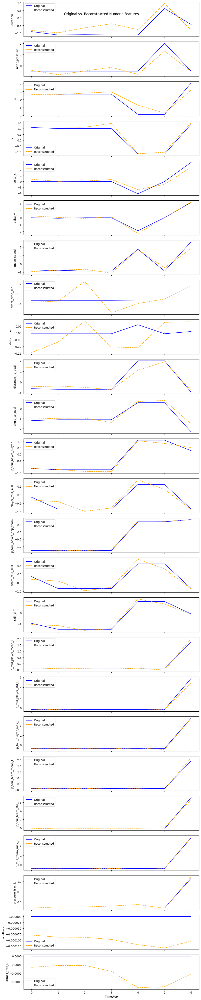

In [105]:
# Visualize reconstruction for sample at index 10
visualize_reconstruction(
    model=model,
    cat_tensors=cat_tensors,
    num_tensor=num_tensor,
    idx=100,
    numeric_cols=numeric_cols,
    device=device
)

In [106]:
model.eval()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

cat_inputs = {k: torch.tensor(v, dtype=torch.long).to(device) for k, v in cat_inputs.items()}
num_inputs = torch.tensor(num_inputs, dtype=torch.float32).to(device)

In [107]:
with torch.no_grad():
    _, event_embeddings = model(cat_inputs, num_inputs)

In [108]:
embedding_array = event_embeddings.cpu().numpy()
embedding_df = pd.DataFrame(embedding_array, columns=[f"emb_{i}" for i in range(embedding_array.shape[1])])

In [109]:
embedding_df

,emb_0,emb_1,emb_2,emb_3,emb_4,emb_5,emb_6,emb_7,emb_8,emb_9,emb_10,emb_11,emb_12,emb_13,emb_14,emb_15,emb_16,emb_17,emb_18,emb_19,emb_20,emb_21,emb_22,emb_23,emb_24,emb_25,emb_26,emb_27,emb_28,emb_29,emb_30,emb_31
0,0.566968,-0.944993,0.000610,-0.314687,-0.321746,-0.973321,-0.542975,-0.400382,-0.346343,0.036786,-0.313036,0.158597,0.281751,0.234436,-0.274763,0.704871,-0.110882,-0.207240,-0.313759,-0.035904,-0.419899,-0.562648,0.136848,-0.316614,-0.619537,0.299555,0.044377,-0.382006,-0.479136,0.219758,0.376047,0.651206
1,0.261152,-1.114980,0.045898,-0.000189,-0.570500,-0.626246,-0.171906,-0.260328,-0.571252,0.123668,-0.723981,0.102248,-0.428395,0.308442,-0.903604,-0.208492,-0.050108,0.318354,-0.363875,-0.146742,-0.193360,-0.056044,0.316854,0.049127,-0.415602,0.234931,0.286699,-0.647901,-0.529944,0.197117,1.034050,0.373522
2,0.597267,-0.876438,0.483292,0.119442,-0.189185,-0.926612,-0.146178,-0.249189,-0.482309,0.228758,-0.214481,0.466651,-0.612401,0.024679,-0.118506,0.438263,0.337697,0.485541,-0.641645,-0.006447,-0.575765,0.174813,-0.297808,-0.126158,-0.362940,0.180077,0.287917,-0.897946,-0.010545,0.371537,0.967093,-0.335085
3,0.231780,-1.774409,0.179105,-0.237588,-0.482267,-1.018080,0.302047,0.229896,0.066072,0.021473,-0.698543,0.389093,-0.552316,0.016280,-0.250295,0.176948,0.331877,0.589255,-0.224287,-0.442960,-0.403800,0.286397,0.240804,-0.189395,-0.739812,0.512245,-0.100965,-0.512710,0.350919,0.313423,0.816935,0.231112
4,0.463613,-1.099463,0.466925,0.104953,-0.337635,-0.980302,-0.310881,-0.064376,-0.679512,0.124495,0.067086,0.494326,-0.405503,-0.042845,-0.251082,0.627921,0.267670,0.644410,-0.736591,-0.191657,-0.489810,0.116496,-0.333903,0.022332,-0.767530,0.121489,0.293056,-0.816443,0.121452,0.492017,0.873843,-0.281342
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
187799,-0.534828,-1.036772,0.098000,-0.087627,-0.717054,-0.574630,0.116480,-0.237341,-0.634822,0.516941,-0.300650,-0.553643,-0.563364,0.772561,-0.215859,0.536861,-0.018372,0.034593,-0.686055,-0.230672,0.613229,0.139180,0.147423,-0.418302,-0.377500,0.061552,-0.400191,-0.280056,-0.077126,0.417110,0.510013,-0.520653
187800,-0.329500,-0.494649,-0.004041,0.099513,-0.448205,-0.527204,-0.132688,-0.523064,-1.247482,0.492699,-0.327147,-0.132269,-0.890088,0.966620,-0.672665,0.836509,-0.342840,-0.119159,-0.687212,-0.262385,0.504047,-0.215645,0.285203,-0.133894,-0.027803,-0.226011,-0.191615,-0.496851,-0.329502,0.570316,0.560844,-0.323888
187801,-0.378755,-0.713495,0.238963,0.056918,-0.507533,-0.513862,-0.244239,-0.297895,-0.393935,0.243343,-0.551047,-0.167302,-0.606756,0.583920,-0.721290,1.013066,-0.275753,0.563991,-0.732229,0.151917,0.041883,0.118983,-0.533955,-0.106934,-0.328738,-0.467000,-0.421642,-1.017501,-0.297782,0.299975,0.620047,-0.617260
187802,-0.796371,-1.414688,-0.065861,0.165061,-0.299411,-0.957887,-0.053616,-0.326910,-0.524404,0.556021,-0.638114,-0.359790,-0.379348,1.003298,-0.422121,0.728215,-0.059976,0.235663,-0.191444,0.091497,0.083622,0.064306,-0.337260,-0.302756,-0.524904,-0.386954,-0.045609,-0.422972,-0.145264,0.545576,0.223054,-0.608556


In [110]:
embedding_df.to_csv("processed_data/event_embeddings_match_week_19.csv")

In [113]:
sampled_model_df['is_foul_won'] = model_df['is_foul_won']

Index(['index'], dtype='object')

In [117]:
sampled_model_df = sampled_model_df.reset_index()

In [119]:
y_dict = model_df[model_df.index.isin(sampled_model_df.index)][['index','is_foul_won']]
y_dict

,index,is_foul_won
0,6,0
1,9,0
2,12,0
3,15,0
4,18,0
...,...,...
187799,3319,0
187800,3322,0
187801,3325,0
187802,3328,0


In [122]:
sampled_model_df['is_foul_won'] = y_dict['is_foul_won']

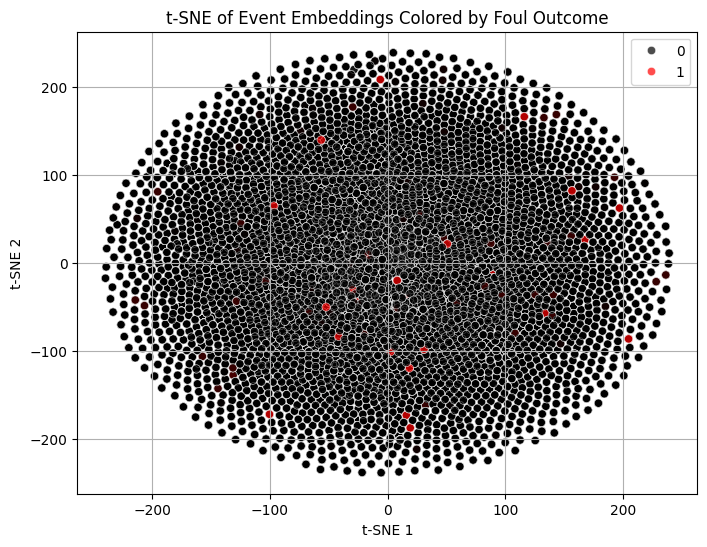

In [124]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns
# tsne = TSNE(n_components=2, perplexity=30, random_state=42)
# emb_2d = tsne.fit_transform(event_embeddings.cpu().numpy())

plt.figure(figsize=(8, 6))
sns.scatterplot(x=emb_2d[:,0], y=emb_2d[:,1], hue=sampled_model_df["is_foul_won"].values, palette={0: "#000000", 1: "#FF0000"}, alpha=0.7)
plt.title("t-SNE of Event Embeddings Colored by Foul Outcome")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.grid(True)
plt.show()

In [125]:
tsne = TSNE(n_components=3, perplexity=30, random_state=42)
emb_3d = tsne.fit_transform(event_embeddings.cpu().numpy())

In [127]:
import plotly.express as px

df = pd.DataFrame({
    "TSNE-1": emb_3d[:,0],
    "TSNE-2": emb_3d[:,1],
    "TSNE-3": emb_3d[:,2],
})

df["label"] = sampled_model_df['is_foul_won']

# 3. plotly scatter_3d
fig = px.scatter_3d(
    df,
    x="TSNE-1", y="TSNE-2", z="TSNE-3",
    color="label",
    title="3D t-SNE (interactive rotate/zoom)",
    width=800, height=600
)
fig.update_traces(marker=dict(size=4, opacity=0.8))
fig.show()